<a href="https://colab.research.google.com/github/Drecho-p/Estadistica_1/blob/main/pp_2_Estadistica_1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Análisis de la distribución y correlación entre la edad de un padre de un recién nacido en Colombia y el numero de embarazos incluido el presente.

*   Jorge Ivan Ojeda Rangel
*   Andrés Javier Sepúlveda Vesga
*   Joseph Stiven Pinzón Cuadros

## Resumen

En el siguiente informe se realiza un análisis sobre la correlacion que tienen las edades de un padre de un recién nacido en colombia en el año 2022 y el número de embarazos, incluido el presente, durante el año 2022. Se estudian las distribuciones de los datos conseguidos en estas dos categorias segun el censo realizado por el Departamento Administrativo Nacional de Estadísticas (DANE) en el año 2022.

Se logró observar que la edad de un padre de un recién nacido en Colombia en el año 2022 y el número de embarazos, incluido el presente, en el año  2022 no presentan distribucion normal. Se pudo encontrar que la mayoria de las edades del padre registradas se encuentran entre los 25 y 35 años y la mayoria de los registros de numeros de embarazos, incluido el presente, son menores o iguales a 2. Además, se pudo determinar que ambas variables tienen una correlación positiva discreta.

## Introducción



Las estadísticas vitales son, de acuerdo al Instituto Nacional de Estadística y Geografía (INEGI): "El resultado del recuento de los hechos más importantes de la vida de la población de un país, como son los nacimientos, defunciones, defunciones fetales, matrimonios y divorcios. [[1]](https://www.inegi.org.mx/contenidos/productos/prod_serv/contenidos/espanol/bvinegi/productos/historicos/2104/702825491680/702825491680.pdf) Estas estadísticas se recogen el fin de conocer y analizar el tamaño y las caracteristicas de la poblacion de un país y se usan para la planificación, seguimiento y evaluación de programas relacionados con la atencion primaria de la salud y la seguridad social [[2]](https://unstats.un.org/unsd/demographic-social/Standards-and-Methods/files/Principles_and_Recommendations/CRVS/M19Rev3-S.pdf).  En Colombia la registraduría asume la funcion de la recoleccion de las estadísticas de nacimientos desde el año 1987 y a partir 1998 el nuevo Sistema de Registro Civil y Estadísticas Vitales se implementa en todo el territorio nacional con el fin de proveer herramientas para el diagnostico de grupos sociales y para el conocimiento de la dinámica de su crecimiento [[3]](https://microdatos.dane.gov.co/index.php/catalog/807/study-description).

En el presente trabajo se dispone a estudiar las edades de los padres de los recien nacidos en Colombia en el año 2022 y el numero de embarazos, incluido el presente, que una que se han reportado en el año 2022. Se pretende revisar las distribuciones que siguen estos dos conjuntos de datos con el fin de encontrar si estas se asemejan a distribuciones normales. Tambien se pretende hacer un estudio de la correlacion entre estos dos conjuntos de datos con el fin de determinar el nivel de dependencia o correlacion entre ambas categorias.

## Metodología


Los datos utilizados en el estudio proceden de la base de datos que lleva por nombre: "Estadísticas Vitales - EEVV - 2022" la cual fue suministrada por el Departamento Administrativo Nacional de Estadística (DANE) y tiene por universo: Hecho vital, nacido vivo o defunción, ocurrido en el territorio nacional en cada año calendario. En particular se estudian los datos proporcionados por el archivo de datos "nac2022". Este archivo contiene 573625 registros cuyos datos fueron obtenidos gracias a certificados de nacido vivo.

Según la información proporcionada por el DANE la recopilacion de los datos se inició el 1 de enero del año 2022 y finalizo el 31 de diciembre del año 2022. Los datos se obtienen a partir de certificados de nacimiento los cuales son expedidos por el médico o enfermera  que haya asistido en el parto. En áreas donde no se tenga este recurso se ha autorizado que auxiliares de enfermería y promotores de salud diligencian el documento. Este documento consiste en un cuestionario del cual se obtienen datos propios del nacimiento, datos de los padres del recién nacido y los datos de quien haya diligenciado el documento [[3]](https://microdatos.dane.gov.co/index.php/catalog/807/study-description).

De este archivo de datos se estudian particularmente las variables "EDAD_PADRE" y "N_EMB". "EDAD_PADRE" es una variable cuantitativa continua la cual representa la edad de un padre de un recien nacido. Dado el caso en que no se tenga información de la edad del padre se ha escrito el valor 999.

Por otro lado la variable "N_EMB" es una variable cuantitativa continua la cual representa el numero de embarazos que ha presentado la madre, incluido el presente. Dado el caso en que no se tenga información sobre el numero de embarazos se ha escrito el valor 99.

Para este estudio se consideraron aquellas observaciones donde la variable "EDAD_PADRE" y "N_EMB" presentaron datos válidos por lo que se descartan los aquellos donde la variable "EDAD_PADRE" presente el valor 999 o la variable "N_EMB" presente el valor 99. De esta forma se obtienen 568276 observaciones válidas para este estudio.

## Resultados e interpretación

In [ ]:
import pandas as pd # Se importan los paquetes y funciones necesarias para e
import io
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from scipy.stats import norm
from scipy.stats import shapiro
import plotly.express as px
from scipy.stats import skew, kurtosis
from sklearn.linear_model import LinearRegression
from scipy.stats import spearmanr, kendalltau
import statsmodels.api as sm
from google.colab import files # Para cargar archivos en google colab

A continuacion se cargan el archivo "nac2022".

In [ ]:
uploaded = files.upload()

Saving nac2022.csv to nac2022.csv


Al filtrar los datos obtenidos de forma que se obtengan resultados validos en las variables "EDAD_PADRE" y "N_EMB" se obtiene la siguiente tabla:

In [ ]:
io_csv = io.BytesIO(uploaded['nac2022.csv'])
tabla = pd.read_csv(io_csv, sep = ",", index_col=0, encoding='latin-1')
df = tabla[["EDAD_PADRE", "N_EMB"]]
df1 = df[(df.EDAD_PADRE < 120) & (df.N_EMB < 99)]
df1

<ipython-input-8-081f2312c5d2>:2: DtypeWarning: Columns (4) have mixed types. Specify dtype option on import or set low_memory=False.
  tabla = pd.read_csv(io_csv, sep = ",", index_col=0, encoding='latin-1')


,EDAD_PADRE,N_EMB
COD_DPTO,,
8,29,2
11,24,2
27,25,4
8,29,4
76,21,1
...,...,...
8,37,2
23,29,5
8,22,2


Ya con los valores filtrados se procede a graficar el histograma de la variable "EDAD_PADRE" junto con la funcion de densidad de probabilidad estimada por un metodo kernel y la distribucion normal teniendo encuenta la media aritmetica y la desviacion estandar estimadas de la variable "EDAD_PADRE".

<ipython-input-24-fc5ae1320bf2>:9: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k" (-> color=(0.0, 0.0, 0.0, 1)). The keyword argument will take precedence.
  plt.plot(x, p, 'k', linewidth=2, label='Distribución Normal', color="darkblue" )


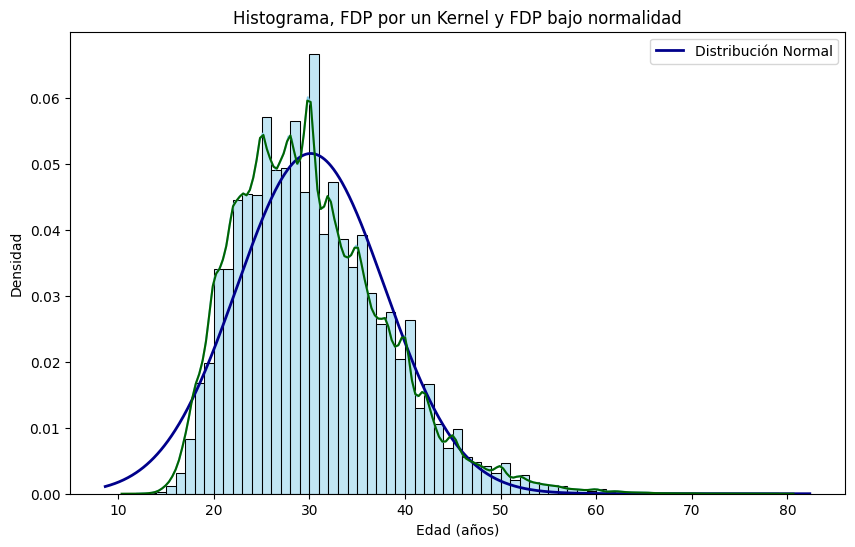

In [ ]:
intervalos1 = range(min(df1.EDAD_PADRE), max(df1.EDAD_PADRE))
plt.figure(figsize=(10, 6))
sns.histplot(x = df1.EDAD_PADRE, bins=intervalos1, kde = True, stat = "density", color = "skyblue", edgecolor = 'black' ) #Grafica de la funcion de la densidad de probabilidad estimada por un metodo kernel

xmin, xmax = plt.xlim()
x = np.linspace(xmin, xmax, 1000)
p = norm.pdf (x, np.mean(df1.EDAD_PADRE), np.std(df1.EDAD_PADRE))

plt.plot(x, p, 'k', linewidth=2, label='Distribución Normal', color="darkblue" )
sns.kdeplot(x=df1.EDAD_PADRE, color = "darkgreen")

plt.title('Histograma, FDP por un Kernel y FDP bajo normalidad')
plt.xlabel('Edad (años)')
plt.ylabel('Densidad')
plt.legend()
plt.show()

A partir del histograma se puede ver que la mayoria de los datos se concentran entre los 25 y 35 años de edad. Estos resultados se asemejan a los resultados proporcionados por el Boletín Técnico de los datos reportados para los años 2019, 2021 y 2023 [[4]](https://www.dane.gov.co/files/operaciones/EEVV/bol-EEVV-Nacimientos-IVtrim2023.pdf). Estos datos tambien se pueden comparar con los resultados reportados en México en el año 2020 por el Instituto Nacional de Estadística y Geografía (INEGI) el cual reportó que la mayoria de las edades de los padres de los recién nacidos se encuentran entre los 25 y 29 años [[5]‌](https://www.inegi.org.mx/contenidos/saladeprensa/boletines/2021/EstSociodemo/NamtosRegistrados2020.pdf) lo cual podria sugerir que esto no es un hecho aislado para Colombia y puede ser estar correlacionados con los datos de otros países.
Como la función de densidad de probabilidad estimada por un método kernel no coincide con la distribución normal bajo la media y varianza estimada de los datos de la edad del padre' de un recién nacido en Colombia en el año 2022 sugiere que la variable EDAD_PADRE" no sigue una distribución normal. Esto último se puede observar con el siguiente diagrama cuantil a cuantil.

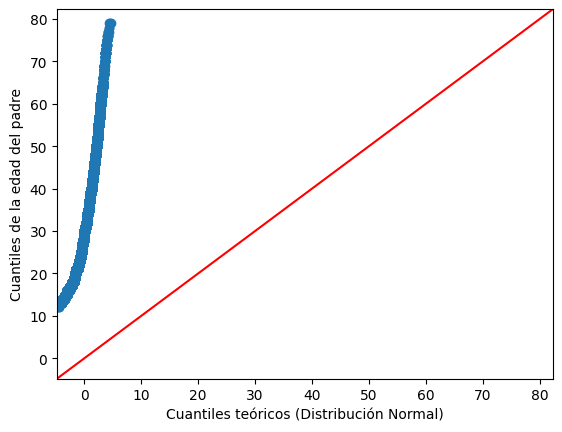

In [ ]:
fig = sm.qqplot(df1["EDAD_PADRE"], line= '45')
plt.xlabel('Cuantiles teóricos (Distribución Normal)')
plt.ylabel('Cuantiles de la edad del padre')
plt.show()

Como los datos no se ajustan a la recta mostrada en el diagrama, visualmente se puede ver que la edad de un padre de un recién nacido en Colombia en el año 2022 no sigue una distribución normal.

Para confirmar este resultado a continuacion se van a escoger de forma aleatoria 100 de los datos registrados se realiza una prueba de Shapiro-Wilk.

In [ ]:
idx = np.random.randint(len(df1.EDAD_PADRE), size = 100)
shapiro(df1.EDAD_PADRE.index[idx])

ShapiroResult(statistic=np.float64(0.8599914070576429), pvalue=np.float64(2.825331728650045e-08))

Vease que el resultado de la prueba de Shapiro-Wilk es $p = 2.825331728650045 \times 10^{-8}$. como $p < 0.05$ entonces se rechaza la hipotesis de que la variable "EDAD_PADRE" presente normalidad.

A continuacion se realiza el diagrama de caja y bigotes de la variable "EDAD_PADRE":

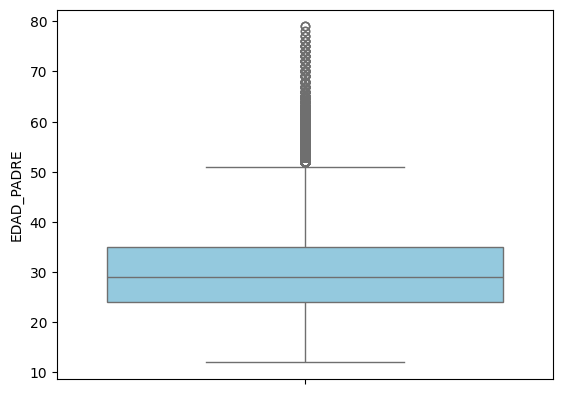

In [ ]:
sns.boxplot(df1.EDAD_PADRE, color = 'skyblue', saturation = 0.75)
plt.show()

A partir de la grafica se puede ver que la mediana del conjunto de datos de la variable "EDAD_PADRE" es aproximadamente de 30 años. Tambien se puede ver que el primer cuartil corresponde a una edad aproximada 25 años mientras que el tercer cuartil corresponde aproximadamente a 35 años. Se puede ver ademas que los datos atipicos son mayores a aproximadamente 50 años.

A continuacion se realiza un diagrama de puntos de los datos de la variable "EDAD_PADRE":

In [ ]:
plt.figure(figsize=(5, 5))
fig = px.strip(df1.EDAD_PADRE, orientation = 'h')
fig.show()

<Figure size 500x500 with 0 Axes>

El diagrama de puntos indica que la edad de un padre de un recien nacido en colombia presenta una alta variabilidad.

A continuacion se calculan las siguientes medidas de tendencia central: media, varianza, desviacion estandar, coeficiente de asimetría y curtosis.

In [ ]:
print(f"media: {np.mean(df1.EDAD_PADRE)}")
print(f"varianza: {np.var(df1.EDAD_PADRE)}")
print(f"desviacion_estandar: {np.std(df1.EDAD_PADRE)}")
print(f"coeficiente de asimetría: {skew(df1.EDAD_PADRE)}")
print(f"curtosis: {kurtosis(df1.EDAD_PADRE)}")

media: 30.14822726984775
varianza: 59.92647978124465
desviacion_estandar: 7.741219528035919
coeficiente de asimetría: 0.7932633846824577
curtosis: 0.8974404731370482


Con estos se pude ver:

*   La edad media de un padre de un recién nacido en Colombia es aproximadamente de 30.1 años.
*   La distancia entre los valores de un padre de un recién nacido en Colombia es de aproximadamente 7.7 años.
*   Como el coeficiente de asimetría es mayor a 0 se tiene que la variable aleatoria "EDAD_PADRE" presenta una asimetria positiva y por tanto la media es mayor a la moda de la variable aleatoria.
*   Como la curtosis es menor a 3 se tiene que la variable aleatoria "EDAD_PADRE" tiene una distribucion platicurtica y por tanto una baja concentracion de los valores con respecto a la media.

En particular se puede ver que la edad media de un padre de un recién nacido en colombia en el año 2022 se asemeja a la edad media de un padre de un recién nacido en el año 2020 en Bucaramanga reportada por Lina Juliana Angarita Moreno, Zaily Marcela Forero Cordero y Diana Marcela Villamizar Céspedes la cual consiste de 30 años [[6]](https://repositorio.udes.edu.co/server/api/core/bitstreams/929cad00-128e-40fb-8da5-b60e4c18961d/content). Este resultado sugiere que los resultados a nivel departamental y municipal pueden llegar a mantenerse.

A continuacion se procede a graficar el histograma de los datos obtenidos para la variable "N_EMB" junto con la funcion de densidad de probabilidad estimada por un metodo kernel y la distribucion normal teniendo encuenta la media aritmetica y la desviacion estandar estimadas de la variable "N_EMB".

<ipython-input-14-0c943fd43c3f>:9: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k" (-> color=(0.0, 0.0, 0.0, 1)). The keyword argument will take precedence.
  plt.plot(x, p, 'k', linewidth=2, label='Distribución Normal', color="darkblue" )


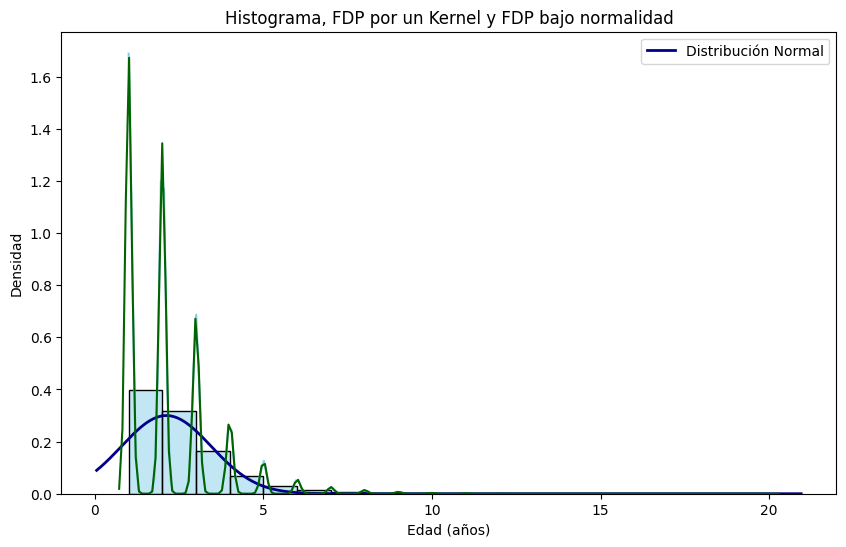

In [ ]:
intervalos1 = range(min(df1.N_EMB), max(df1.N_EMB))
plt.figure(figsize=(10, 6))
sns.histplot(x = df1.N_EMB, bins=intervalos1, kde = True, stat = "density", color = "skyblue", edgecolor = 'black' ) #Grafica de la funcion de la densidad de probabilidad estimada por un metodo kernel

xmin, xmax = plt.xlim()
x = np.linspace(xmin, xmax, 1000)
p = norm.pdf (x, np.mean(df1.N_EMB), np.std(df1.N_EMB))

plt.plot(x, p, 'k', linewidth=2, label='Distribución Normal', color="darkblue" )
sns.kdeplot(x=df1.N_EMB, color = "darkgreen")

plt.title('Histograma, FDP por un Kernel y FDP bajo normalidad')
plt.xlabel('Edad (años)')
plt.ylabel('Densidad')
plt.legend()
plt.show()

Se puede ver en el histograma que la mayoria de los datos registran 1 o 2 embarazos incluido el presente.

El hecho de que la funcion de densidad de probabilidad de la variable aleatoria "N_EMB" estimada mediante un metodo kernel no coincida con la distribucion normal sugiere que la variable "N_EMB" no presenta normalidad. Esto último se puede observar con el siguiente diagrama cuantil a cuantil.

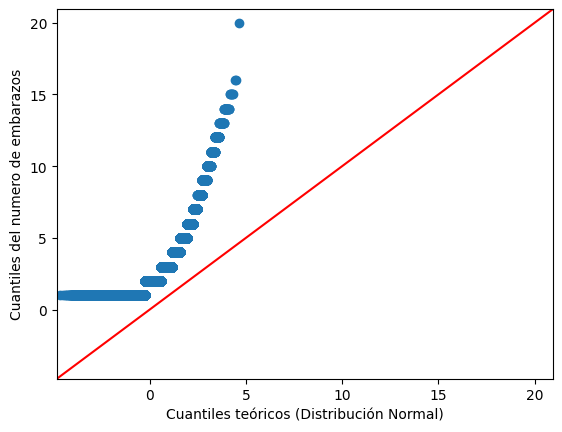

In [ ]:
fig_2 = sm.qqplot(df1["N_EMB"], line= '45')
plt.xlabel('Cuantiles teóricos (Distribución Normal)')
plt.ylabel('Cuantiles del numero de embarazos')
plt.show()

Como los datos no se ajustan a la recta mostrada en el diagrama visualmente se puede ver que el número de embarazos, incluido el presente registrados en Colombia en el año 2022 no sigue una distribución normal.

Para confirmar este resultado a continuacion se van a escoger de forma aleatoria 100 de los datos registrados se realiza una prueba de Shapiro-Wilk.

In [ ]:
idx = np.random.randint(len(df1.N_EMB), size = 100)
shapiro(df1.N_EMB.index[idx])

ShapiroResult(statistic=np.float64(0.886274636224964), pvalue=np.float64(3.3774808967261125e-07))

Vease que el resultado de la prueba de Shapiro-Wilk es $p = 3.3774808967261125 \times 10^{-7}$. como $p < 0.05$ entonces se rechaza la hipotesis de que la variable "N_EMB" presente normalidad.

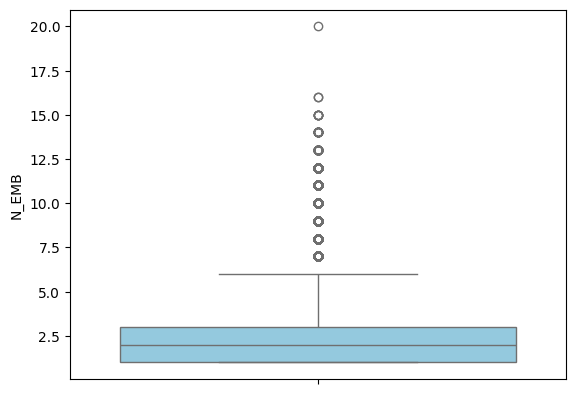

In [ ]:
sns.boxplot(df1.N_EMB, color = 'skyblue', saturation = 0.75)
plt.show()

A partir del diagrama de cajas y bigotes se puede ver que la media del número de embarazos es de aproximadamente 2 embarazos. Ademas se puede ver que el primer cuartil corresponde a aproximadamente 1 embarazo mientras que el tercer cuartil corresponde a 3 embarazos. Se puede ver que se consideran como datos atípicos a aquellos que corresponden a mas de 6 embarazos aproximadamente.

In [ ]:
plt.figure(figsize=(5, 5))
fig = px.strip(df1.N_EMB, orientation = 'h')
fig.show()

<Figure size 500x500 with 0 Axes>

El diagrama de puntos indica que el numero de embarazos incluido el presente presenta una alta variabilidad.

A continuacion se calculan las siguientes medidas de tendencia central: media, varianza, desviacion estandar, coeficiente de asimetría y curtosis.

In [ ]:
print(f"media: {np.mean(df1.N_EMB)}")
print(f"varianza: {np.var(df1.N_EMB)}")
print(f"desviacion estandar: {np.std(df1.N_EMB)}")
print(f"coeficiente de asimetría: {skew(df1.N_EMB)}")
print(f"curtosis: {kurtosis(df1.N_EMB)}")

media: 2.1172476050369893
varianza: 1.7708594227426895
desviacion estandar: 1.3307364212129649
coeficiente de asimetría: 1.914832955537591
curtosis: 5.941785429223298


Con estos se pude ver:

*   El numero de embarazos promedio en Colombia es aproximadamente 2.1.
*   La distancia entre el numero de embarazos en Colombia es aproximadamente 1.3 embarazos.
*   Como el coeficiente de asimetría es mayor a 0 se tiene que la variable aleatoria "N_EMB" presenta una asimetria positiva y por tanto la media es mayor a la moda de la variable aleatoria.
*   Como la curtosis es mayor a 3 se tiene que la variable aleatoria tiene una distribucion leptocurtica y por tanto una alta concentracion de los valores con respecto a la media.


En particular se puede ver que la media del numero de embarazos, incluido el presente, que fueron reportados en el año 2022 se asemeja a la media del numero de embarazos, incluido el presente, que fueron reportados en el año 2020 en Bucaramanga reportada por Lina Juliana Angarita Moreno, Zaily Marcela Forero Cordero y Diana Marcela Villamizar Céspedes la cual consiste de 2.1 embarazos [[6]](https://repositorio.udes.edu.co/server/api/core/bitstreams/929cad00-128e-40fb-8da5-b60e4c18961d/content). Esto sugiere que los resultados pueden llegar a mantenerse de forma departamental y municipal.

A continuación se dibuja el diagrama de dispersion de los datos obtenidos de la variable "EDAD_PADRE" con los datos obtenidos de la variable "N_EMB" con el fin de estudiar la correlación entre estas dos variables.

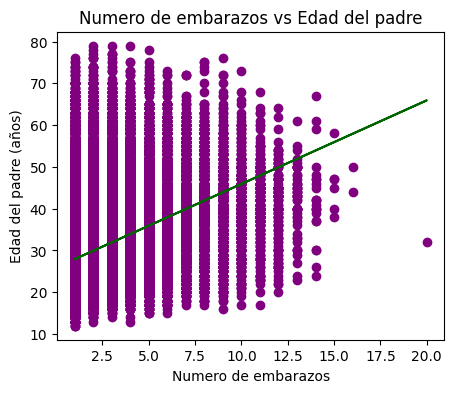

In [ ]:
modelo = LinearRegression()
modelo.fit(np.array(df1["N_EMB"]).reshape(-1,1), np.array(df1["EDAD_PADRE"]).reshape(-1,1))
predi_lineal = modelo.predict(np.array(df1.N_EMB).reshape(-1,1))
predi_lineal

plt.figure(figsize=(5,4))
plt.scatter(df1["N_EMB"], df1["EDAD_PADRE"], color = "purple", marker = "o")
plt.plot(df1.N_EMB, predi_lineal, linestyle='-', color = "darkgreen")
plt.xlabel('Numero de embarazos')
plt.ylabel('Edad del padre (años)')
plt.title('Numero de embarazos vs Edad del padre')
plt.show()


En el diagrama de dispersion se puede observar que los puntos no siguen un patron particular. Por lo tanto las variables "N_EMB" y "EDAD_PADRE" son independientes o no estan correlacionadas, de esta forma un número de embarazos alto pudo haber ocurrido con un padre joven con un padre de mayor edad al igual que un numero bajo de embarazos pudo haber ocurrido con un padre joven asi como uno de edad mayor. La recta de regresion lineal indica una correlación positiva, por lo que un mayor número de embarazos implica, por lo general, que el padre tiene mayor edad.

Para estudiar el grado de correlación entre estas dos variables se calculan, a continuación, los coeficientes de correlación de Pearson, Spearman y Kendall.

In [ ]:
pearson_corr = np.corrcoef(df1["N_EMB"], df1["EDAD_PADRE"])[0,1]
spearman_corr, _ = spearmanr(df1["N_EMB"], df1["EDAD_PADRE"])
kendall_corr, _ = kendalltau(df1["N_EMB"], df1["EDAD_PADRE"])
print(f"Coeficiente de correlación de Pearson: {pearson_corr}.")
print(f"Coeficiente de correlación de Spearman: {spearman_corr}.")
print(f"Coeficiente de correlación de Kendall: {kendall_corr}.")

Coeficiente de correlación de Pearson: 0.3439949710988243.
Coeficiente de correlación de Spearman: 0.3709076724499916.
Coeficiente de correlación de Kendall: 0.28930213851230707.


De acuerdo con la interpretacion dada por J. Richard Landis y Gary G. Koch en su articulo "The Measurement of Observer Agreement for Categorical Data" [[7]](https://www.jstor.org/stable/2529310) como los coeficientes de correlación de Pearson, Spearman y Kendall cumplen que:
$0.2<|\rho(X,Y)|< 0.4, \ 0.2<|\eta(X,Y)| <0.4 $ y $0.2<|\kappa(X,Y)| <0.4$ respectivamente, entonces se tiene que las variables "N_EMB" y "EDAD_PADRE" estan discretamente correlacionadas.

## Conclusiones



Teniendo en cuenta la interpretación de los resultado obtenidos se puede concluir que los datos de la edad del padre de un recién nacido en Colombia en el año 2022  tanto como los datos registrados en el año 2022 del número de embarazos, incluido el presente no siguen una distribucion normal. Se puede ver que la mayoria de las edades de los padres de un recién nacido en Colombia en el año 2022 se encuentran entre los 25 y 35 años de edad y que se considera atípico el que la edad supere los 50 años aproximadamente. Con respecto al numero de embarazos incluido el presente en el año 2022 se puede ver que la mayoria reporta haber tenido entre 1 y 2 embarazos mientras que se considera atípico el que una persona reporte más de 3 embarazos.

Por ultimo se puede ver que el numero de embarazos incluido el presente en el año 2022 tiene una correlacion positiva discreta con la edad del padre de un recién nacido en Colombia en el año 2022. De esta forma aunque se pueden encontrar un numero alto y bajo de embarazos reportados con un padre de joven o de mayor edad, por lo general se puede ver que a mayor numero de embarazos se obtiene un padre de un recién nacido con mayor edad.

## Bibliografia

[[1] el ABC DE LAS ESTADISTICAS VITALES miINGGI INSTITUTO NACIONAL DE ESTADISTICA GEOGRAFIA E INFORMATICA [Internet]. Disponible en: https://www.inegi.org.mx/contenidos/productos/prod_serv/contenidos/espanol/bvinegi/productos/historicos/2104/702825491680/702825491680.pdf](https://www.inegi.org.mx/contenidos/productos/prod_serv/contenidos/espanol/bvinegi/productos/historicos/2104/702825491680/702825491680.pdf)

[[2] Revisión. Principios y recomendaciones para un sistema de estadísticas vitales [Internet]. Disponible en: https://unstats.un.org/unsd/demographic-social/Standards-and-Methods/files/Principles_and_Recommendations/CRVS/M19Rev3-S.pdf](https://unstats.un.org/unsd/demographic-social/Standards-and-Methods/files/Principles_and_Recommendations/CRVS/M19Rev3-S.pdf)

[[3] Departamento Administrativo Nacional de Estadística: www.dane.gov.co](https://microdatos.dane.gov.co/index.php/catalog/807/study-description)

[[4] Estadísticas Vitales (EEVV) [Internet]. Disponible en: https://www.dane.gov.co/files/operaciones/EEVV/bol-EEVV-Nacimientos-IVtrim2023.pdf](https://www.dane.gov.co/files/operaciones/EEVV/bol-EEVV-Nacimientos-IVtrim2023.pdf)

[[5] 1.COMUNICADO DE PRENSA NÚM. 535/21 23 DE SEPTIEMBRE DE 2021 PÁGINA 1/2 COMUNICACIÓN SOCIAL [Internet]. Disponible en: https://www.inegi.org.mx/contenidos/saladeprensa/boletines/2021/EstSociodemo/NamtosRegistrados2020.pdf
‌](https://www.inegi.org.mx/contenidos/saladeprensa/boletines/2021/EstSociodemo/NamtosRegistrados2020.pdf)

[[6] Angarita Moreno L, Forero Cordero Z, Villamizar Céspedes D. Características de los Recién Nacidos Vivos en Bucaramanga en el Año 2020 [Internet]. Universidad de Santander; 2023. Available from: https://repositorio.udes.edu.co/server/api/core/bitstreams/929cad00-128e-40fb-8da5-b60e4c18961d/content](https://repositorio.udes.edu.co/server/api/core/bitstreams/929cad00-128e-40fb-8da5-b60e4c18961d/content)

[[7] Richard LJ, Koch GG. The Measurement of Observer Agreement for Categorical Data. Biometrics. 1977 Mar;33(1):159–74.](https://www.jstor.org/stable/2529310)



